<a href="https://colab.research.google.com/github/iN8mare/Neural-Style-Transfer/blob/main/Neural_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Learning & Art: Neural Style Transfer




#### I have uploaded the images on my drive, so let's mount the drive. You can upload the entire image folder from my github onto your drive.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<a name='1'></a>
## 1 - Packages

Run the following code cell to import the necessary packages and dependencies you will need to perform Neural Style Transfer.

In [2]:
import os
import sys
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf
import pprint
%matplotlib inline

<a name='2'></a>
## Problem Statement

Neural Style Transfer (NST) is one of the most fun and interesting optimization techniques in deep learning. It merges two images, namely: a <strong>"content" image (C)</strong> and a <strong>"style" image (S)</strong>, to create a <strong>"generated" image (G)</strong>. The generated image G combines the "content" of the image C with the "style" of image S. 

Let's get started!

<a name='3'></a>
## Transfer Learning


Neural Style Transfer (NST) uses a previously trained convolutional network, and builds on top of that. The idea of using a network trained on a different task and applying it to a new task is called transfer learning. 

We will be using the the epynomously named VGG network from the [original NST paper](https://arxiv.org/abs/1508.06576) published by the Visual Geometry Group at University of Oxford in 2014. Specifically, we'll use VGG-19, a 19-layer version of the VGG network. This model has already been trained on the very large ImageNet database, and has learned to recognize a variety of low level features (at the shallower layers) and high level features (at the deeper layers). 

Run the following code to load parameters from the VGG model. This may take a few seconds. 

#### **IMPORTANT :** In case you want to download the weight file directly from kaggle run the below code else skip it.
(Useful if you are working with colab as it takes lot of time to upload large files)

In [3]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/  # first upload your Kaggle API Token

!kaggle datasets download -d keras/vgg19 # Downloading the weights of VGG19 model as a zip file

import zipfile    
zip_ref = zipfile.ZipFile('/content/vgg19.zip', 'r')
zip_ref.extractall('/content')  # Unzipping the zip file to content directory (as I am working with colab)
zip_ref.close()

100% 578M/580M [00:27<00:00, 24.2MB/s]
100% 580M/580M [00:27<00:00, 21.8MB/s]


In [4]:
tf.random.set_seed(272) # DO NOT CHANGE THIS VALUE
pp = pprint.PrettyPrinter(indent=4)
img_size = 300 # Works better with larger images but if you have GPU constraints then 300 size also works fine!
vgg = tf.keras.applications.VGG19(include_top=False,
                                  input_shape=(img_size, img_size, 3),
                                  weights='/content/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5')
                                           # remember to use the "notop" file only!

vgg.trainable = False
pp.pprint(vgg)

<a name='4'></a>
## 4 - Neural Style Transfer (NST)

Next, we will be building the Neural Style Transfer (NST) algorithm in three steps:

- First, you will build the content cost function $J_{content}(C,G)$
- Second, you will build the style cost function $J_{style}(S,G)$
- Finally, you'll put it all together to get $J(G) = \alpha J_{content}(C,G) + \beta J_{style}(S,G)$. Exciting!

<a name='4-1'></a>
### 4.1 - Computing the Content Cost

<a name='4-1-1'></a>
#### 4.1.1 - Make Generated Image G Match the Content of Image C

One goal you should aim for when performing NST is for the content in generated image G to match the content of image C. To do so, you'll need an understanding of <b> shallow versus deep layers </b>:

* The shallower layers of a ConvNet tend to detect lower-level features such as <i>edges and simple textures</i>.
* The deeper layers tend to detect higher-level features such as more <i> complex textures and object classes</i>. 

#### To choose a "middle" activation layer $a^{[l]}$ :
You need the "generated" image G to have similar content as the input image C. Suppose you have chosen some layer's activations to represent the content of an image. 
* In practice, you'll get the most visually pleasing results if you choose a layer in the <b>middle</b> of the network--neither too shallow nor too deep. This ensures that the network detects both higher-level and lower-level features.

#### To forward propagate image "C:"
* Set the image C as the input to the pretrained VGG network, and run forward propagation.  
* Let $a^{(C)}$ be the hidden layer activations in the layer you had chosen. This will be an $n_H \times n_W \times n_C$ tensor.

#### To forward propagate image "G":
* Repeat this process with the image G: Set G as the input, and run forward propagation. 
* Let $a^{(G)}$ be the corresponding hidden layer activation. 

In this running example, the content image C will be the picture of the **Taj Mahal in Agra, India.** Run the code below to see a picture of the Taj Mahal.

What a beauty!


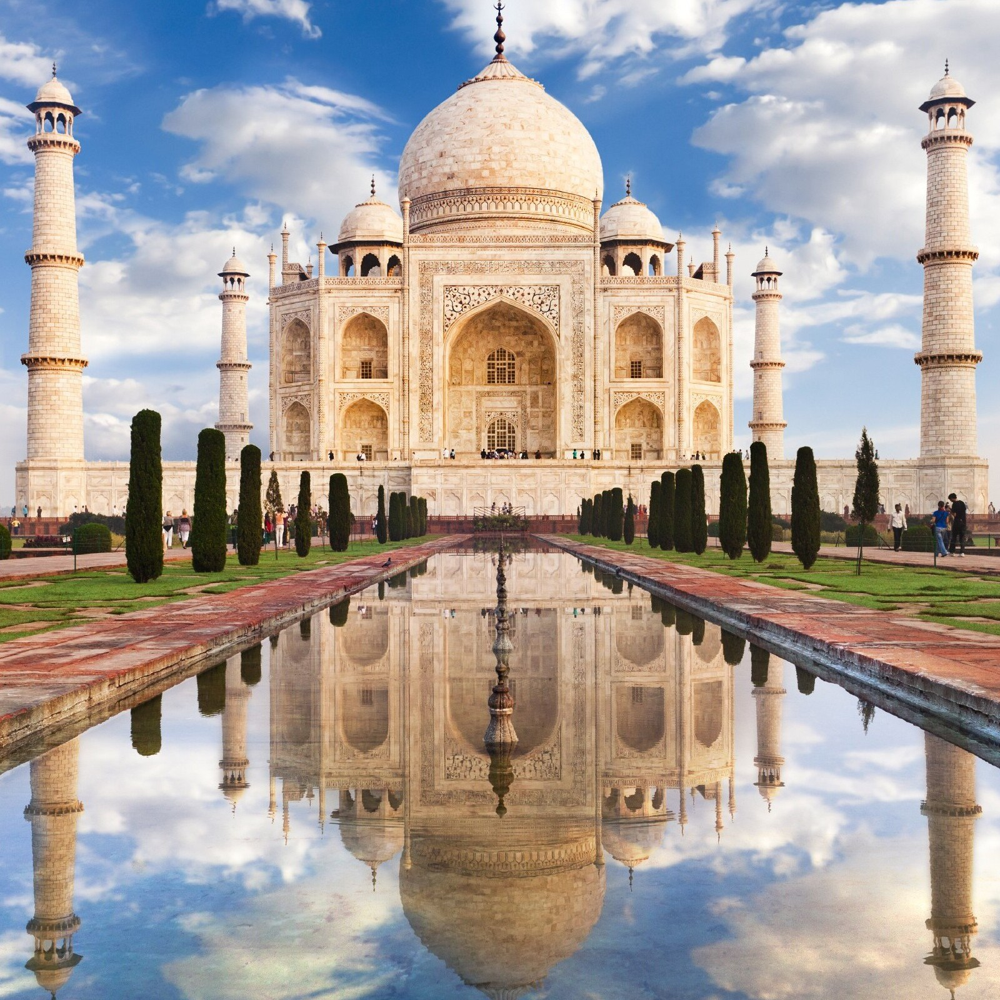

In [5]:
content_image = Image.open("/content/drive/MyDrive/NST_Images/Content Image/taj_mahal.jpg")
print("What a beauty!")
content_image

<a name='4-1-2'></a>
#### 4.1.2 - Content Cost Function $J_{content}(C,G)$
One goal you should aim for when performing NST is for the content in generated image G to match the content of image C. A method to achieve this is to calculate the content cost function, which will be defined as:

$$J_{content}(C,G) =  \frac{1}{4 \times n_H \times n_W \times n_C}\sum _{ \text{all entries}} (a^{(C)} - a^{(G)})^2\tag{1} $$

* Here, $n_H, n_W$ and $n_C$ are the height, width and number of channels of the hidden layer you have chosen, and appear in a normalization term in the cost. 
* For clarity, note that $a^{(C)}$ and $a^{(G)}$ are the 3D volumes corresponding to a hidden layer's activations. 
* In order to compute the cost $J_{content}(C,G)$, it might also be convenient to unroll these 3D volumes into a 2D matrix, as shown below.
* Technically this unrolling step isn't needed to compute $J_{content}$, but it will be good practice for when you do need to carry out a similar operation later for computing the style cost $J_{style}$.


<a name='ex-1'></a>
### compute_content_cost

Compute the "content cost" using TensorFlow. 



In [5]:
def compute_content_cost(content_output, generated_output):
    """
    Computes the content cost
    
    Arguments:
    a_C -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image C 
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image G
    
    Returns: 
    J_content -- scalar that you compute using equation 1 above.
    """
    a_C = content_output[-1]
    a_G = generated_output[-1]
    
    # Retrieve dimensions from a_G
    m, n_H, n_W, n_C = a_G.get_shape().as_list()

    # Reshape a_C and a_G 
    a_C_unrolled = tf.reshape(a_C, (m, -1, n_C))
    a_G_unrolled = tf.reshape(a_G, (m, -1, n_C))
    
    # compute the cost with tensorflow
    J_content = tf.reduce_sum(tf.square(a_C_unrolled- a_G_unrolled))

    return J_content

**What you should remember:**
    
- The content cost takes a hidden layer activation of the neural network, and measures how different $a^{(C)}$ and $a^{(G)}$ are. 
- When you minimize the content cost later, this will help make sure $G$ has similar content as $C$. 


<a name='4-2'></a>
### 4.2 - Computing the Style Cost

For the running example, you will use the following style image: 

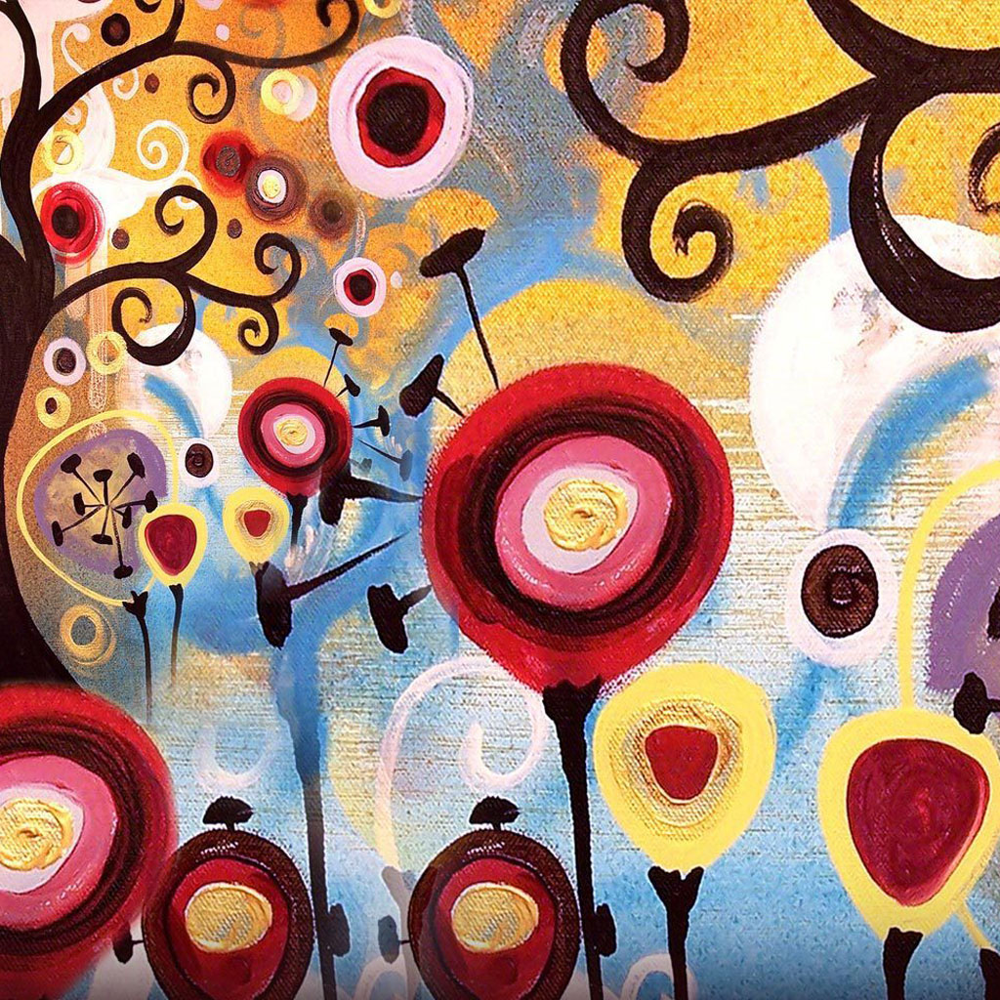

In [7]:
example = Image.open("/content/drive/MyDrive/NST_Images/Style Image/candy.jpg")
example

Now let's see how you can now define a "style" cost function $J_{style}(S,G)$!

<a name='4-2-1'></a>
#### 4.2.1 - Style Matrix

#### Gram matrix
* The style matrix is also called a "Gram matrix." 
* In linear algebra, the Gram matrix G of a set of vectors $(v_{1},\dots ,v_{n})$ is the matrix of dot products, whose entries are ${\displaystyle G_{ij} = v_{i}^T v_{j} = np.dot(v_{i}, v_{j})  }$. 
* In other words, $G_{ij}$ compares how similar $v_i$ is to $v_j$: If they are highly similar, you would expect them to have a large dot product, and thus for $G_{ij}$ to be large. 




#### Compute Gram matrix $G_{gram}$
We will compute the Style matrix by multiplying the "unrolled" filter matrix with its transpose:


$$\mathbf{G}_{gram} = \mathbf{A}_{unrolled} \mathbf{A}_{unrolled}^T$$

#### $G_{(gram)ij}$: correlation
The result is a matrix of dimension $(n_C,n_C)$ where $n_C$ is the number of filters (channels). The value $G_{(gram)i,j}$ measures how similar the activations of filter $i$ are to the activations of filter $j$. 

#### $G_{(gram),ii}$: prevalence of patterns or textures
* The diagonal elements $G_{(gram)ii}$ measure how "active" a filter $i$ is. 
* For example, suppose filter $i$ is detecting vertical textures in the image. Then $G_{(gram)ii}$ measures how common  vertical textures are in the image as a whole.
* If $G_{(gram)ii}$ is large, this means that the image has a lot of vertical texture. 


By capturing the prevalence of different types of features ($G_{(gram)ii}$), as well as how much different features occur together ($G_{(gram)ij}$), the Style matrix $G_{gram}$ measures the style of an image. 

In [6]:
def gram_matrix(A):
    """
    Argument:
    A -- matrix of shape (n_C, n_H*n_W)
    
    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """  
    GA = tf.matmul(A, tf.transpose(A))
    return GA

<a name='4-2-2'></a>
#### 4.2.2 - Style Cost

Our next goal will be to minimize the distance between the Gram matrix of the "style" image S and the Gram matrix of the "generated" image G. 
* For now, we will use only a single hidden layer $a^{[l]}$.  
* The corresponding style cost for this layer is defined as: 

$$J_{style}^{[l]}(S,G) = \frac{1}{4 \times {n_C}^2 \times (n_H \times n_W)^2} \sum _{i=1}^{n_C}\sum_{j=1}^{n_C}(G^{(S)}_{(gram)i,j} - G^{(G)}_{(gram)i,j})^2\tag{2} $$

* $G_{gram}^{(S)}$ Gram matrix of the "style" image.
* $G_{gram}^{(G)}$ Gram matrix of the "generated" image.



In [7]:
def compute_layer_style_cost(a_S, a_G):
    """
    Arguments:
    a_S -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image S 
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image G
    
    Returns: 
    J_style_layer -- tensor representing a scalar value, style cost defined above by equation (2)
    """

    # Retrieve dimensions from a_G
    _, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    # Reshape the tensors from (1, n_H, n_W, n_C) to (n_C, n_H * n_W)
    a_S = tf.transpose(tf.reshape(a_S, (-1, n_C)))
    a_G = tf.transpose(tf.reshape(a_G, (-1, n_C)))

    # Computing gram_matrices for both images S and G 
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    # Computing the loss 
    J_style_layer = tf.reduce_sum(tf.square(GS - GG))/(4*((n_C)**2) * (n_H**2) * n_W**2)
    
    return J_style_layer

<a name='4-2-3'></a>
#### 4.2.3 Style Weights

* So far we have captured the style from only one layer. 
* We'll get better results if you "merge" style costs from several different layers. 
* Each layer will be given weights ($\lambda^{[l]}$) that reflect how much each layer will contribute to the style.
* By default, give each layer equal weight, and the weights add up to 1.  ($\sum_{l}^L\lambda^{[l]} = 1$)

Start by listing the layer names:

In [8]:
for layer in vgg.layers:
    print(layer.name)

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


Get a look at the output of a layer `block5_conv4`. You will later define this as the content layer, which will represent the image.

Now choose layers to represent the style of the image and assign style costs:

In [9]:
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)]

You can combine the style costs for different layers as follows:

$$J_{style}(S,G) = \sum_{l} \lambda^{[l]} J^{[l]}_{style}(S,G)$$

where the values for $\lambda^{[l]}$ are given in `STYLE_LAYERS`. 


In [10]:
def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):
    """
    Computes the overall style cost from several chosen layers
    
    Arguments:
    style_image_output -- our tensorflow model
    generated_image_output --
    STYLE_LAYERS -- A python list containing:
                        - the names of the layers we would like to extract style from
                        - a coefficient for each of them
    
    Returns: 
    J_style -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    
    # initialize the overall style cost
    J_style = 0

    # Set a_S to be the hidden layer activation from the layer we have selected.
    # The last element of the array contains the content layer image, which must not be used.
    a_S = style_image_output[:-1]

    # Set a_G to be the output of the choosen hidden layers.
    # The last element of the list contains the content layer image which must not be used.
    a_G = generated_image_output[:-1]
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):  
        # Compute style_cost for the current layer
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])

        # Add weight * J_style_layer of this layer to overall style cost
        J_style += weight[1] * J_style_layer

    return J_style

How do you choose the coefficients for each layer? The deeper layers capture higher-level concepts, and the features in the deeper layers are less localized in the image relative to each other. So if you want the generated image to softly follow the style image, try choosing larger weights for deeper layers and smaller weights for the first layers. In contrast, if you want the generated image to strongly follow the style image, try choosing smaller weights for deeper layers and larger weights for the first layers.



<br>
<font color = 'blue'>
    
**What you should remember:**
    
- The style of an image can be represented using the Gram matrix of a hidden layer's activations. 
- You get even better results by combining this representation from multiple different layers. 
- This is in contrast to the content representation, where usually using just a single hidden layer is sufficient.
- Minimizing the style cost will cause the image $G$ to follow the style of the image $S$. 
   



<a name='4-3'></a>
### 4.3 - Defining the Total Cost to Optimize

Finally, you will create a cost function that minimizes both the style and the content cost. The formula is: 

$$J(G) = \alpha J_{content}(C,G) + \beta J_{style}(S,G)$$


In [11]:
@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    """
    Computes the total cost function
    
    Arguments:
    J_content -- content cost coded above
    J_style -- style cost coded above
    alpha -- hyperparameter weighting the importance of the content cost
    beta -- hyperparameter weighting the importance of the style cost
    
    Returns:
    J -- total cost as defined by the formula above.
    """
    J = alpha*J_content + beta*J_style
    return J

$\alpha$ and $\beta$ are hyperparameters that control the relative weighting between content and style.

<a name='5'></a>
## 5 - Solving the Optimization Problem

Finally, we will put everything together to implement Neural Style Transfer!


Here's what your program be able to do:

1. Load the content image 
2. Load the style image
3. Randomly initialize the image to be generated 
4. Load the VGG19 model
5. Compute the content cost
6. Compute the style cost
7. Compute the total cost
8. Define the optimizer and learning rate

Here are the individual steps in detail.

<a id='part(4)'></a>

<a name='5-1'></a>
### 5.1 Load the Content Image
Run the following code cell to load, reshape, and normalize your "content" image C (the Taj Mahal picture):

In [14]:
content_image_path = "/content/drive/MyDrive/NST_Images/Content Image/taj_mahal.jpg"
style_image_path = "/content/drive/MyDrive/NST_Images/Style Image/candy.jpg"

#below lines of code will be used while naming our generated images.
content_img_name = content_image_path.split(".")[0].split("/")[-1]  # can vary if your path looks different
style_img_name = style_image_path.split(".")[0].split("/")[-1]  # can vary if your path looks different
print(content_img_name)
print(style_img_name)

taj_mahal
candy


(1, 300, 300, 3)


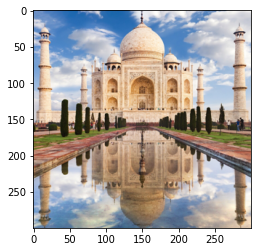

In [15]:
content_image = np.array(Image.open(content_image_path).resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

<a name='5-2'></a>
### 5.2 Load the Style Image
Now load, reshape and normalize your "style" image (Candy painting):

(1, 300, 300, 3)


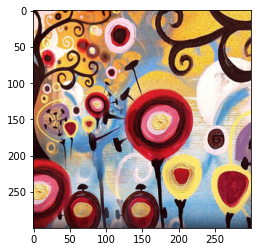

In [16]:
style_image =  np.array(Image.open(style_image_path).resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

<a name='5-3'></a>
### 5.3 Randomly Initialize the Image to be Generated
Now, we will initialize the "generated" image as a noisy image created from the content_image.

* The generated image is slightly correlated with the content image.
* By initializing the pixels of the generated image to be mostly noise but slightly correlated with the content image, this will help the content of the "generated" image more rapidly match the content of the "content" image. 

(1, 300, 300, 3)


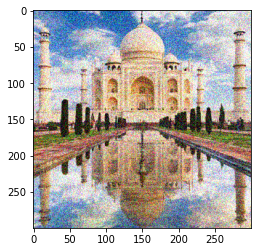

In [17]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

<a name='5-4'></a>
## 5.4 - Load Pre-trained VGG19 Model

In [12]:
def get_layer_outputs(vgg, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

Now, define the content layer and build the model.

In [13]:
content_layer = [('block5_conv4', 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

Save the outputs for the content and style layers in separate variables.

In [20]:
content_target = vgg_model_outputs(content_image)  # Content encoder
style_targets = vgg_model_outputs(style_image)     # Style encoder

<a name='5-5'></a>
### 5.5 - Compute Total Cost

<a name='5-5-1'></a>
#### 5.5.1 - Compute the Content image Encoding (a_C)

You've built the model, and now to compute the content cost, you will encode your content image using the appropriate hidden layer activations. Set this encoding to the variable `a_C`. Later in the assignment, you will need to do the same for the generated image, by setting the variable `a_G` to be the appropriate hidden layer activations. You will use layer `block5_conv4` to compute the encoding. The code below does the following:

1. Set a_C to be the tensor giving the hidden layer activation for layer "block5_conv4" using the content image.

In [21]:
# Assign the content image to be the input of the VGG model.  
# Set a_C to be the hidden layer activation from the layer we have selected
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

<a name='5-5-2'></a>
#### 5.5.2 - Compute the Style image Encoding (a_S) 

The code below sets a_S to be the tensor giving the hidden layer activation for `STYLE_LAYERS` using our style image.

In [22]:
# Assign the input of the model to be the "style" image 
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

Below are the utils that you will need to display the images generated by the style transfer model.

In [14]:
def clip_0_1(image):
    """
    Truncate all the pixels in the tensor to be between 0 and 1
    
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """
    Converts the given tensor into a PIL image
    
    Returns:
    Image: A PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

Implement the train_step() function for transfer learning

* Use the Adam optimizer to minimize the total cost `J`.
* Use a learning rate of 0.025
* [Adam Optimizer documentation](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/Adam)
* Within the tf.GradientTape():
   * Compute the encoding of the generated image using vgg_model_outputs. Assign the result to a_G.
   * Compute the total cost J, using the global variables a_C, a_S and the local a_G
   * Use `alpha = 10` and `beta = 40`.

In [36]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.025)

@tf.function()
def train_step(generated_image, a_S, a_C):
    with tf.GradientTape() as tape:
        # In this function you must use the precomputed encoded images a_S and a_C
        # Compute a_G as the vgg_model_outputs for the current generated image

        a_G = vgg_model_outputs(generated_image)
        
        # Compute the style cost

        J_style = compute_style_cost(a_S, a_G)

        # Compute the content cost
        J_content = compute_content_cost(a_C, a_G)
        # Compute the total cost
        J = total_cost(J_content, J_style,alpha = 10, beta = 40)
        
    grad = tape.gradient(J, generated_image)

    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))

    return J

<a name='5-6'></a>
### 5.6 - Train the Model

Run the following cell to generate an artistic image. It should take about 3min on a GPU for 2000 iterations. Neural Style Transfer is generally trained using GPUs.

If you increase the learning rate you can speed up the style transfer, but often at the cost of quality.

In [16]:
# to make sure we are using GPU on colab
import tensorflow as tf
tf.test.gpu_device_name()  # output must be --> '/device:GPU:0'

'/device:GPU:0'

Epoch 0 


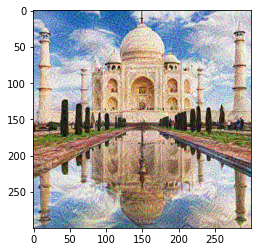

Epoch 250 


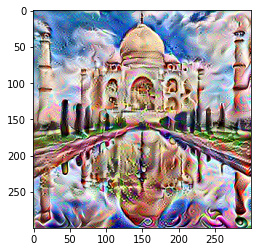

Epoch 500 


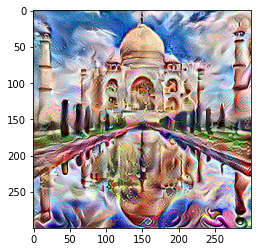

Epoch 750 


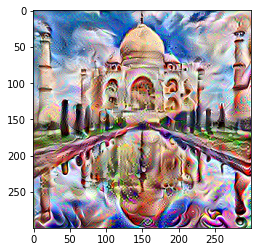

Epoch 1000 


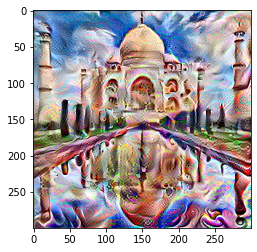

Epoch 1250 


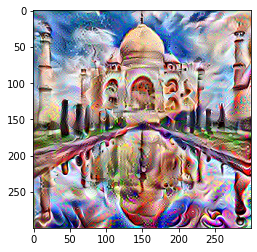

Epoch 1500 


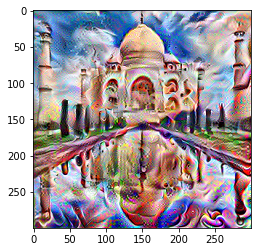

In [51]:
# Show the generated image at some epochs
# Uncomment to reset the style transfer process. You will need to compile the train_step function again 
epochs = 1501
generated_image = tf.Variable(generated_image)
for i in range(epochs):
    train_step(generated_image)
    if i % 250 == 0:
        print(f"Epoch {i} ")
    if i % 250 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        image.save(f"/content/Generated Images/{content_img_name.upper()}x{style_img_name.upper()}_{i}.jpg")
        plt.show() 

Now, run the following code cell to see the results!

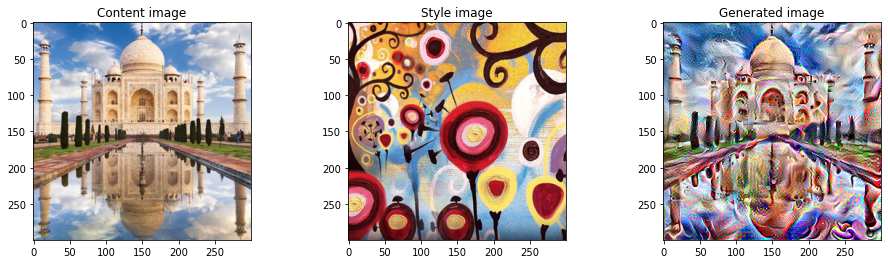

In [52]:
# Show the 3 images in a row
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text('Generated image')
plt.show()

<a name='7'></a>
## References

The Neural Style Transfer algorithm was due to Gatys et al. (2015). Harish Narayanan and Github user "log0" also have highly readable write-ups this lab was inspired by. The pre-trained network used in this implementation is a VGG network, which is due to Simonyan and Zisserman (2015). Pre-trained weights were from the work of the MathConvNet team. 

- Leon A. Gatys, Alexander S. Ecker, Matthias Bethge, (2015). [A Neural Algorithm of Artistic Style](https://arxiv.org/abs/1508.06576) 
- Harish Narayanan, [Convolutional neural networks for artistic style transfer.](https://harishnarayanan.org/writing/artistic-style-transfer/)
- Log0, [TensorFlow Implementation of "A Neural Algorithm of Artistic Style".](http://www.chioka.in/tensorflow-implementation-neural-algorithm-of-artistic-style)
- Karen Simonyan and Andrew Zisserman (2015). [Very deep convolutional networks for large-scale image recognition](https://arxiv.org/pdf/1409.1556.pdf)
- [MatConvNet.](http://www.vlfeat.org/matconvnet/pretrained/)


In [37]:
def everything_in_one_go(content_image_path, style_image_path, to_save_path):

  #below lines of code will be used while naming our generated images.
  content_img_name = content_image_path.split(".")[0].split("/")[-1]  # can vary if your path looks different
  style_img_name = style_image_path.split(".")[0].split("/")[-1]  # can vary if your path looks different
  print(content_img_name)
  print(style_img_name)

  content_image = np.array(Image.open(content_image_path).resize((img_size, img_size)))
  content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

  style_image =  np.array(Image.open(style_image_path).resize((img_size, img_size)))
  style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

  generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
  noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
  generated_image = tf.add(generated_image, noise)
  generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

  def get_layer_outputs(vgg, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

  content_layer = [('block5_conv4', 1)]
  vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

  content_target = vgg_model_outputs(content_image)  # Content encoder
  style_targets = vgg_model_outputs(style_image)     # Style encoder

  preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
  a_C = vgg_model_outputs(preprocessed_content)

  preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
  a_S = vgg_model_outputs(preprocessed_style)

  epochs = 2501
  generated_image = tf.Variable(generated_image)
  for i in range(epochs):
      train_step(generated_image, a_S, a_C)
      if i % 500 == 0:
          image = tensor_to_image(generated_image)
          image.save(f"{to_save_path}/{content_img_name.upper()}x{style_img_name.upper()}_{i}.jpg")
  
  # Show the 3 images in a row
  fig = plt.figure(figsize=(16, 4))
  ax = fig.add_subplot(1, 3, 1)
  imshow(content_image[0])
  ax.title.set_text('Content image')
  ax = fig.add_subplot(1, 3, 2)
  imshow(style_image[0])
  ax.title.set_text('Style image')
  ax = fig.add_subplot(1, 3, 3)
  imshow(generated_image[0])
  ax.title.set_text('Generated image')
  plt.show()
           

taj_mahal
ben_giles


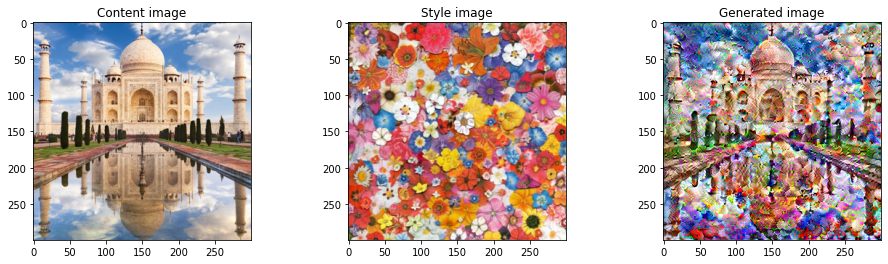

taj_mahal
candy


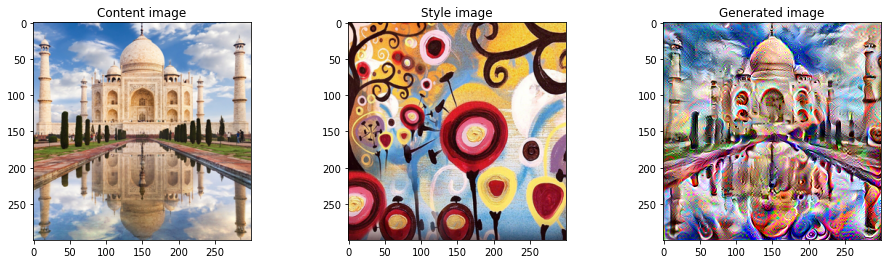

taj_mahal
vg_starry_night


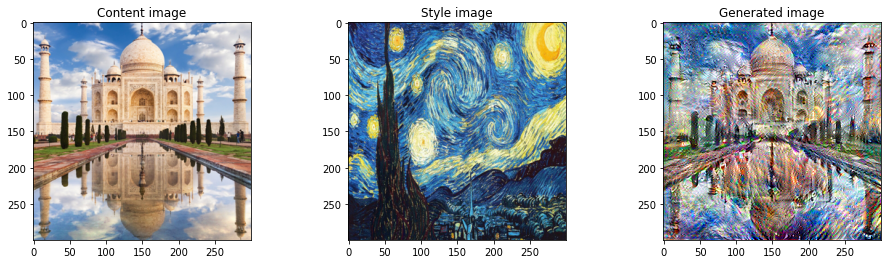

figures
ben_giles


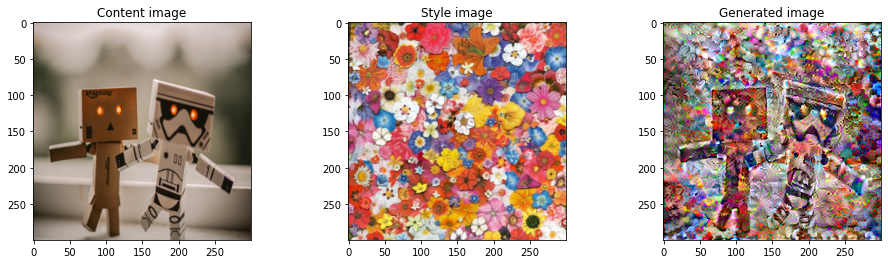

figures
candy


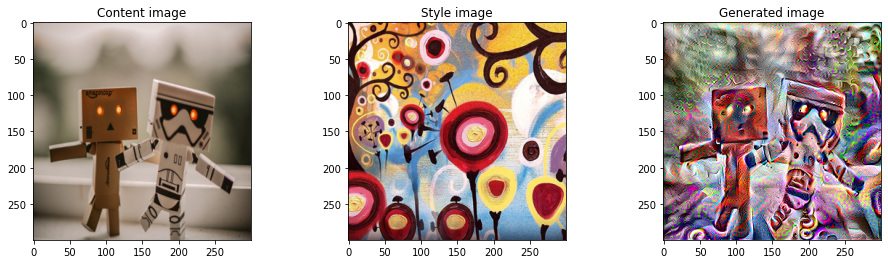

figures
vg_starry_night


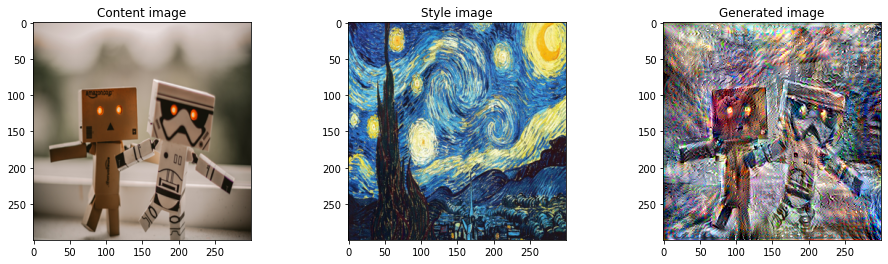

green_bridge
ben_giles


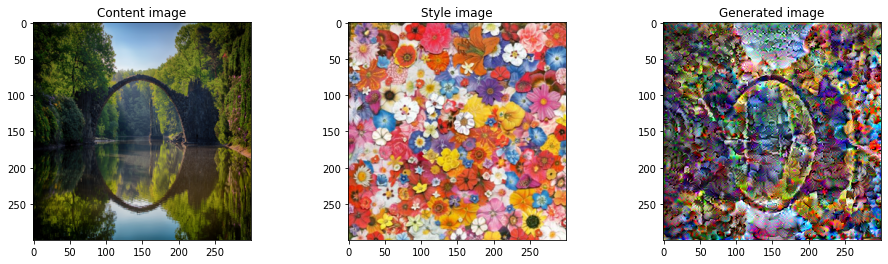

green_bridge
candy


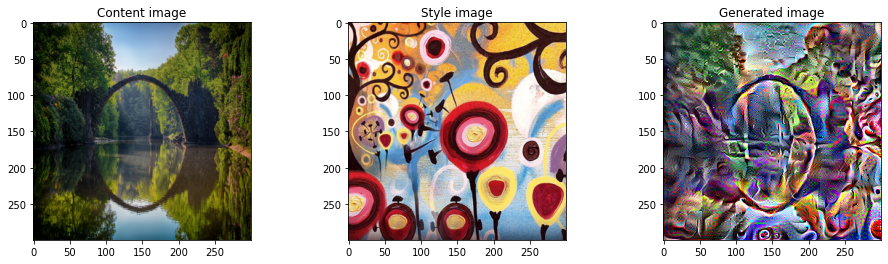

green_bridge
vg_starry_night


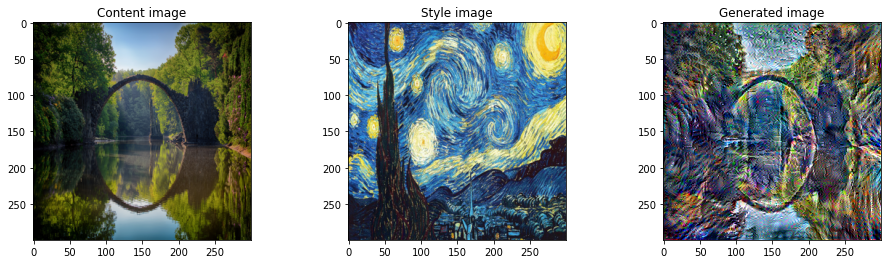

In [43]:
content_image_folder = "/content/drive/MyDrive/NST_Images/Content Image"
style_image_folder = "/content/drive/MyDrive/NST_Images/Style Image"
to_save_path = "/content/Generated_Images"
os.makedirs(to_save_path)
for content_img in os.listdir(content_image_folder):
  for style_img in os.listdir(style_image_folder):
    content_img_path = content_image_folder + "/" + content_img
    style_img_path = style_image_folder + "/" + style_img
    everything_in_one_go(content_img_path, style_img_path, to_save_path)